<center><h1>YuHsuan_Lu_HW6</h1></center>
<br>
<br>

Name: Yu-Hsuan Lu
<br>
Github Username: @YuHsuan-Lu
<br>
USC ID: 6849388612

## 1. Tree-Based Methods

Import packages

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay,accuracy_score,roc_auc_score, mean_absolute_error

### (a) Download the APS Failure data

In [2]:
og_train_df = pd.read_csv('data/aps_failure_training_set.csv',skiprows=19)
og_test_df = pd.read_csv('data/aps_failure_test_set.csv',skiprows=19)

In [3]:
og_train_df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,na,2130706438,280,0,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,neg,33058,na,0,na,0,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,neg,41040,na,228,100,0,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,neg,12,0,70,66,0,10,0,0,0,...,240,46,58,44,10,0,0,0,4,32
4,neg,60874,na,1368,458,0,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,na,664,186,0,0,0,0,0,...,998500,566884,1290398,1218244,1019768,717762,898642,28588,0,0
59996,neg,2286,na,2130706538,224,0,0,0,0,0,...,10578,6760,21126,68424,136,0,0,0,0,0
59997,neg,112,0,2130706432,18,0,0,0,0,0,...,792,386,452,144,146,2622,0,0,0,0
59998,neg,80292,na,2130706432,494,0,0,0,0,0,...,699352,222654,347378,225724,194440,165070,802280,388422,0,0


### (b) Data Preparation

#### (i) Research what types of techniques are usually used

1. Mean, Median, or Mode Imputation
2. Forward Fill and Backward Fill
3. Interpolation
4. K-Nearest Neighbors (K-NN)
5. Regression Imputation
6. Multiple Imputation
7. Domain-Specific Imputation

#### (ii) Calculate the coefficient of variation

In [4]:
from sklearn.impute import SimpleImputer
def imput(df):
    imputed_df = df.replace('na',np.nan)
    imputed_df = imputed_df.iloc[:, 1:]
    imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
    imp_mean.fit(imputed_df)
    temp_df = imp_mean.transform(imputed_df)
    imputed_df = pd.DataFrame(temp_df, columns=imputed_df.columns)
    return imputed_df

In [5]:
imputed_train_df = imput(og_train_df)
imputed_test_df = imput(og_test_df)
imputed_train_df.head()

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.0,0.713189,2.130706e+09,280.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058.0,0.713189,0.000000e+00,190620.639314,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040.0,0.713189,2.280000e+02,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12.0,0.000000,7.000000e+01,66.000000,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874.0,0.713189,1.368000e+03,458.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0


In [6]:
cv = np.apply_along_axis(lambda x: np.var(x) / np.mean(x), axis=0, arr=imputed_train_df.values)
cv

array([3.56434050e+05, 3.86644886e+00, 1.67604690e+09, 6.44286022e+09,
       3.66740049e+03, 3.83201834e+03, 1.87095003e+06, 1.18535355e+06,
       2.59628066e+06, 6.47621046e+06, 1.27525066e+07, 9.49624246e+06,
       9.11566304e+06, 4.00870791e+06, 1.34732564e+06, 5.56459202e+06,
       9.57593536e+06, 2.92556612e+06, 2.19421748e+06, 5.44021915e+06,
       4.86897090e+06, 7.65449479e+06, 1.73471588e+07, 1.53370322e+07,
       9.39725679e+06, 3.56722230e+06, 5.83579521e+01, 9.46437519e+05,
       2.79132682e+06, 1.07122659e+06, 3.73284533e+04, 5.62811907e+03,
       1.67261096e+07, 2.78020047e+07, 1.65300857e+07, 5.83349012e+06,
       1.17689723e+07, 1.71736081e+07, 9.85677864e+06, 1.66756073e+07,
       1.49840484e+07, 8.16158906e+06, 6.83045862e+05, 2.58481086e+05,
       1.39302208e+06, 4.83677339e+06, 1.17208679e+07, 1.93235345e+07,
       7.85636601e+06, 4.47514646e+06, 3.32816724e+05, 2.49241922e+05,
       1.00757857e+07, 6.08479812e+06, 3.42337405e+06, 2.02139410e+06,
      

#### (iii) Plot a correlation matrix

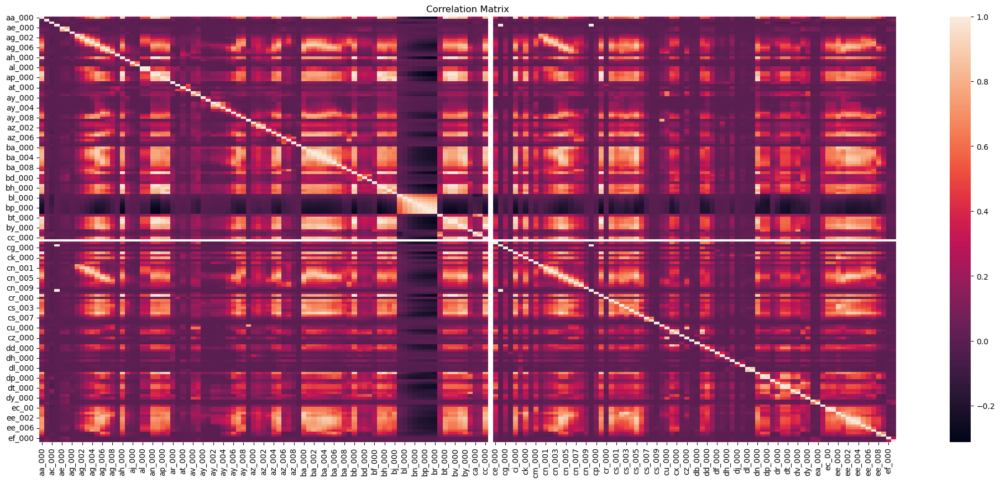

In [7]:
plt.figure(figsize=(25, 10))
sns.heatmap(imputed_train_df.corr())
plt.title('Correlation Matrix')
plt.show()

#### (iv) Make scatter plots and box plots

In [8]:
import math
cols = imputed_train_df.columns.values
col_cv = pd.DataFrame(np.column_stack([cols, cv]))
#col_cv = col_cv.drop(0)
col_cv = col_cv.sort_values(1, ascending=False)
print("Coeficients of all the coloumns")
print(col_cv)

high_var13 = col_cv.head(int(math.floor(math.sqrt(170))))
selected_cols = imputed_train_df[high_var13[0]]
print("Selected 13 Coloumns ")
print(high_var13)
# indices_of_top_k_cv = cv_df.nlargest(13).index.tolist()
# indices_of_top_k_cv
selected_cols

Coeficients of all the coloumns
          0                  1
91   cf_000  6456369192.343713
109  co_000  6446413715.090729
3    ad_000  6442860221.367688
145  dq_000  2002783628.035602
2    ac_000  1676046902.685779
..      ...                ...
168  ef_000         201.150868
26   ar_000          58.357952
1    ab_000           3.866449
93   ch_000             1.5043
89   cd_000                0.0

[170 rows x 2 columns]
Selected 13 Coloumns 
          0                  1
91   cf_000  6456369192.343713
109  co_000  6446413715.090729
3    ad_000  6442860221.367688
145  dq_000  2002783628.035602
2    ac_000  1676046902.685779
155  eb_000   175486814.197449
136  dh_000    62233759.319252
122  cs_009     43132202.36219
140  dl_000    39249967.379462
149  du_000    31470952.602388
33   ay_001    27802004.745272
62   bb_000    25903749.044085
81   bu_000    25818142.972403


,cf_000,co_000,ad_000,dq_000,ac_000,eb_000,dh_000,cs_009,dl_000,du_000,ay_001,bb_000,bu_000
0,2.000000,220.000000,280.000000,0.0,2.130706e+09,2801180.0,0.0,0.0,0.0,14745580.0,0.0,6700214.0,6700214.0
1,190221.810984,190515.566938,190620.639314,0.0,0.000000e+00,3477820.0,0.0,0.0,0.0,4510080.0,0.0,3646660.0,3646660.0
2,0.000000,0.000000,100.000000,0.0,2.280000e+02,1040120.0,0.0,0.0,0.0,300240.0,0.0,2673338.0,2673338.0
3,2.000000,2.000000,66.000000,2014.0,7.000000e+01,0.0,0.0,0.0,0.0,15740.0,0.0,21614.0,21614.0
4,0.000000,202.000000,458.000000,0.0,1.368000e+03,21173050.0,0.0,0.0,0.0,457040.0,0.0,4289260.0,4289260.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0.000000,224.000000,186.000000,0.0,6.640000e+02,80125300.0,0.0,0.0,0.0,470800.0,0.0,10845228.0,10845228.0
59996,2.000000,0.000000,224.000000,0.0,2.130707e+09,1285980.0,0.0,0.0,0.0,823720.0,0.0,147638.0,147638.0
59997,2.000000,0.000000,18.000000,4544.0,2.130706e+09,0.0,0.0,0.0,0.0,7920.0,0.0,43738.0,43738.0
59998,2.000000,580.000000,494.000000,0.0,2.130706e+09,39881280.0,190.0,0.0,0.0,25232340.0,0.0,6159728.0,6159728.0


/Users/olivia/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


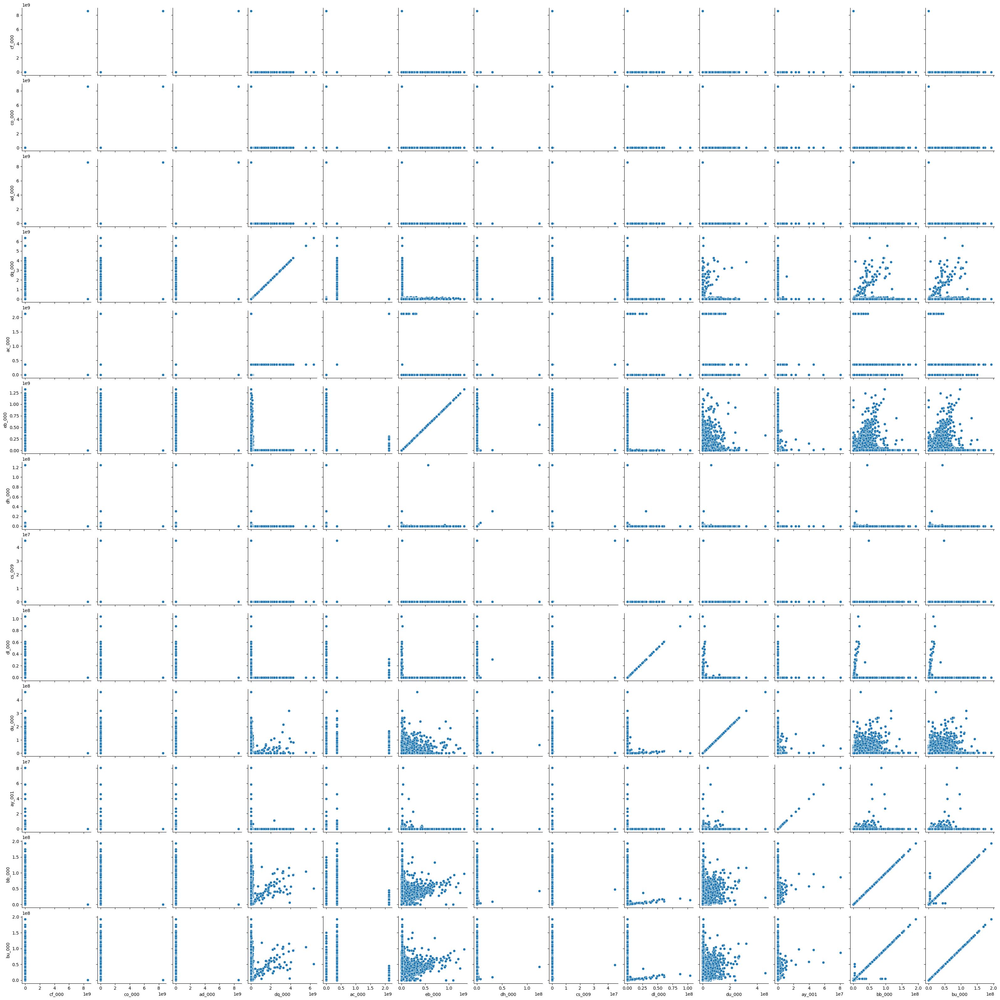

In [9]:
sns.pairplot(selected_cols,diag_kind=None)

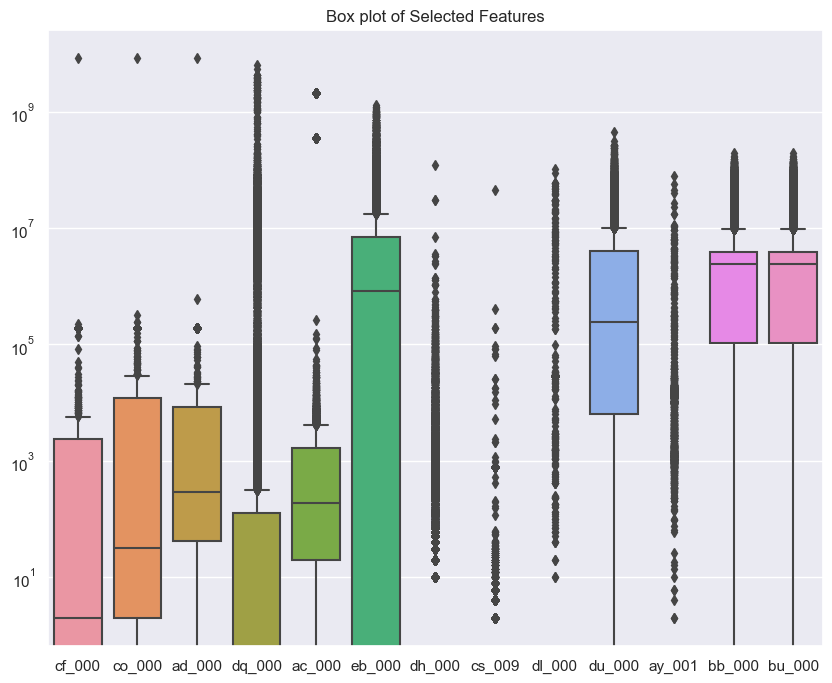

In [10]:
sns.set(rc={'figure.figsize':(10,8)})
box = sns.boxplot(data=selected_cols)
box.set(yscale="log")
plt.title('Box plot of Selected Features')
plt.show()

#### (v) Is this data set imbalanced?

the minority class in the dataset constitutes less than 10% of the total data; therefore, it's imbalanced.

In [11]:
count_pos = len(og_train_df[og_train_df['class'] == "pos"])
count_neg = len(og_train_df[og_train_df['class'] == "neg"])
isImbalanced = (count_pos / (count_pos+count_neg)) < 0.1
isImbalanced

True

### (c) Train a random forest

In [12]:
X_train = imputed_train_df
y_train = og_train_df["class"]
X_test = imputed_test_df
y_test = og_test_df["class"]

In [13]:
def make_prediction(model,X):
    y_pred = model.predict(X)
    y_pred_prob = model.predict_proba(X)
    return y_pred, y_pred_prob

In [14]:
def plot_cm_roc(y,y_pred, y_pred_prob, title, xgb):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    disp = ConfusionMatrixDisplay.from_predictions(y, y_pred, ax=ax1)
    ax1.set_title(f'Confusion Matrix for {title}')
    if(xgb==False):
        RocCurveDisplay.from_predictions(y, y_pred_prob[:, 1], pos_label='pos', ax=ax2)
    else:
        RocCurveDisplay.from_predictions(y, y_pred_prob[:, 1], ax=ax2)
    ax2.set_title(f'ROC Curve for {title}')
    plt.show()

In [15]:
def print_metrics(model,y,y_pred, y_pred_prob, title, xgb):
    print(f'ROC AUC Score for {title} is: ', roc_auc_score(y, y_pred_prob[:, 1]))
    print(f'Accuracy Score for {title} is: ', accuracy_score(y, y_pred))
    if(xgb==False):
        oob_error = 1 - model.oob_score_
        print(f'OOB Error for {title} is: ', round(oob_error,4))
    test_error = 1 - accuracy_score(y, y_pred)
    print(f'Test Error for {title} is: ', round(test_error,4))

In [16]:
def get_metrics(model,X,y,title, xgb = False):
    y_pred, y_pred_prob = make_prediction(model,X)
    plot_cm_roc(y,y_pred, y_pred_prob,title,xgb)
    print_metrics(model,y,y_pred, y_pred_prob,title, xgb)

In [17]:
model_rf = RandomForestClassifier(max_depth = 5, n_estimators=100, random_state=60000,oob_score=True)
model_rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=5, oob_score=True, random_state=60000)

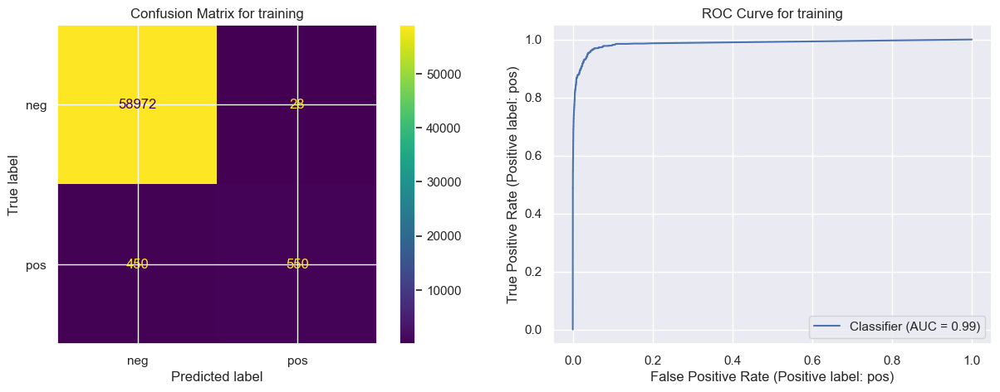

ROC AUC Score for training is:  0.9868075254237288
Accuracy Score for training is:  0.9920333333333333
OOB Error for training is:  0.0094
Test Error for training is:  0.008


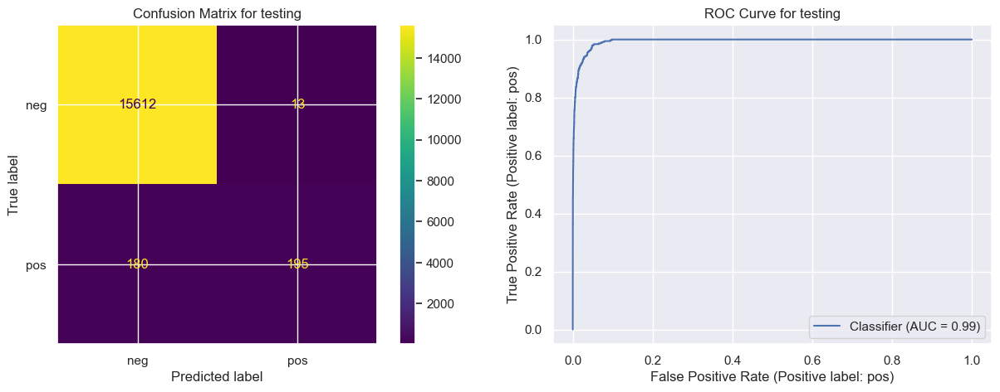

ROC AUC Score for testing is:  0.9941294933333333
Accuracy Score for testing is:  0.9879375
OOB Error for testing is:  0.0094
Test Error for testing is:  0.0121


In [18]:
get_metrics(model_rf, X_train,y_train,"training")
get_metrics(model_rf,X_test,y_test,"testing")

### (d) Research class imbalance in random forest

1. Weighted Random Forest (WRF) 
2. Balanced Random Forest (BRF)
3. Under Sampling (US) 
4. Down Sampling (DS)

In [19]:
model_imrf = RandomForestClassifier(max_depth = 5, n_estimators=100, random_state=60000, class_weight='balanced', oob_score=True)
model_imrf.fit(X_train, y_train)
# y_pred = clf.predict(X_test)
# y_pred_prob = clf.predict_proba(X_test)

RandomForestClassifier(class_weight='balanced', max_depth=5, oob_score=True,
                       random_state=60000)

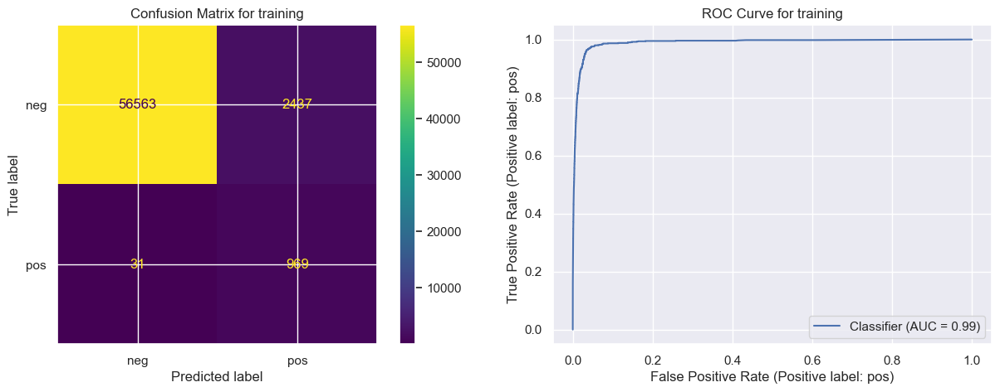

ROC AUC Score for training is:  0.9893124322033897
Accuracy Score for training is:  0.9588666666666666
OOB Error for training is:  0.0424
Test Error for training is:  0.0411


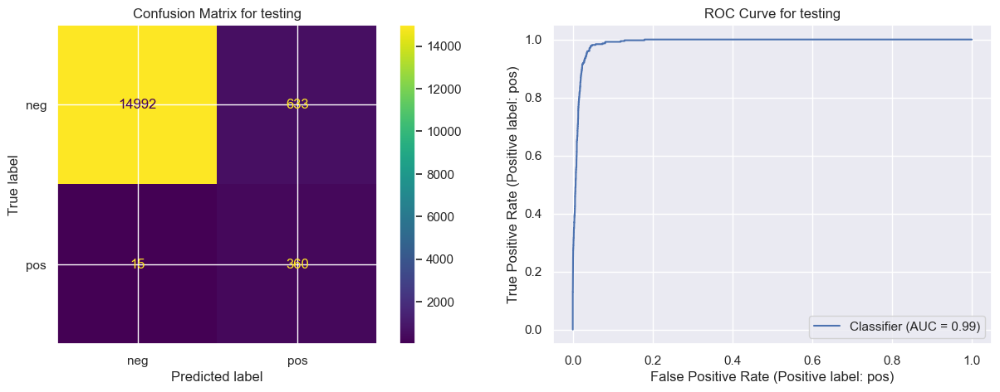

ROC AUC Score for testing is:  0.9890988373333334
Accuracy Score for testing is:  0.9595
OOB Error for testing is:  0.0424
Test Error for testing is:  0.0405


In [20]:
get_metrics(model_imrf,X_train,y_train,"training")
get_metrics(model_imrf,X_test,y_test,"testing")

### (e) XGBoost and Model Trees

In [21]:
!pip install xgboost
from xgboost import XGBRegressor, cv, DMatrix, XGBClassifier
from sklearn.model_selection import KFold

In [22]:
y_train_xgb = y_train.replace({'neg': 0, 'pos': 1})
y_test_xgb = y_test.replace({'neg': 0, 'pos': 1})

In [23]:
def XGBoostCV(fold_num):
    maes = []
    alphas = [0.01, 0.05, 0.1, 0.2, 0.5, 0.75, 1.2, 1.4, 1.6, 1.8, 2, 3, 4, 5, 10, 20]
    for alpha in alphas:
        mae = []
        data_dmatrix = DMatrix(data=X_train,label=y_train_xgb)
        params = {"objective":"binary:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                        'max_depth': 5, 'alpha': alpha}
        xgb_clf = XGBClassifier(**params)
        xgb_clf.fit(X_train, y_train_xgb)

        y_pred = xgb_clf.predict(X_test)
        xgb_cv = cv(dtrain=data_dmatrix, params=params, nfold=5,
                        num_boost_round=50, early_stopping_rounds=fold_num, metrics="auc", as_pandas=True, seed=123)

        xgb_cv_df = pd.DataFrame(xgb_cv)
        mae = xgb_cv_df.mean()['test-auc-mean']

        maes.append([mae,alpha])
    mae_df = pd.DataFrame(maes)
    mae_df = mae_df.sort_values(0, ascending=False)
    return mae_df

In [24]:
XGB_5 = XGBoostCV(5)
XGB_5 

,0,1
0,0.983087,0.01
6,0.982430,1.20
4,0.981610,0.50
11,0.981543,3.00
1,0.980797,0.05
3,0.980490,0.20
2,0.980308,0.10
7,0.979229,1.40
9,0.978929,1.80
12,0.976505,4.00


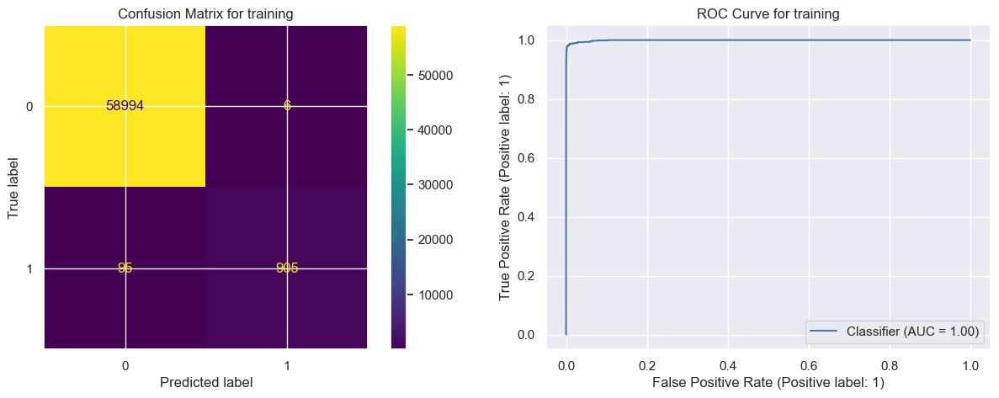

ROC AUC Score for training is:  0.9992905169491526
Accuracy Score for training is:  0.9983166666666666
Test Error for training is:  0.0017


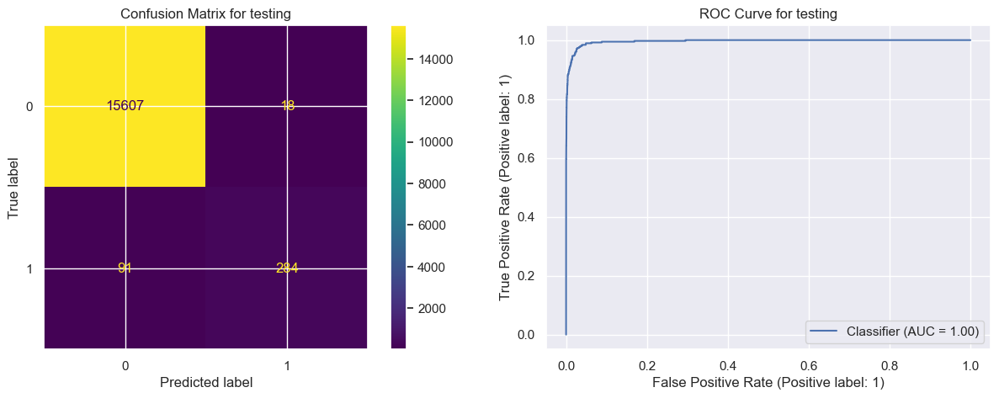

ROC AUC Score for testing is:  0.9959466666666666
Accuracy Score for testing is:  0.9931875
Test Error for testing is:  0.0068


In [25]:
# model_xgb = XGBClassifier(random_state=60000, reg_alpha=0.01).fit(X_train, y_train_xgb)
params = {"objective":"binary:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                        'max_depth': 5, 'alpha': 0.01}
model_xgb = XGBClassifier(**params).fit(X_train, y_train_xgb)
# y_pred_train = xgb.predict(X_train)
# y_pred = xgb.predict(X_test)
# y_pred_prob = xgb.predict_proba(X_test)
get_metrics(model_xgb,X_train,y_train_xgb,"training",True)
get_metrics(model_xgb,X_test,y_test_xgb,"testing",True)
# mae = mean_absolute_error(y_test_xgb, y_pred_prob[:, 1])
# print('Mean Absolute Error: %.3f' % mae)

### (f) Use SMOTE to pre-process your data

In [26]:
!pip uninstall scikit-learn -y
!pip uninstall scikit-learn -y
!pip uninstall imbalanced-learn -y
!pip uninstall imbalanced-learn -y
!pip install scikit-learn
!pip install imbalanced-learn

Found existing installation: scikit-learn 1.3.2
Uninstalling scikit-learn-1.3.2:
  Successfully uninstalled scikit-learn-1.3.2
Found existing installation: imbalanced-learn 0.11.0
Uninstalling imbalanced-learn-0.11.0:
  Successfully uninstalled imbalanced-learn-0.11.0
  Obtaining dependency information for scikit-learn from https://files.pythonhosted.org/packages/40/c6/2e91eefb757822e70d351e02cc38d07c137212ae7c41ac12746415b4860a/scikit_learn-1.3.2-cp311-cp311-macosx_12_0_arm64.whl.metadata
  Using cached scikit_learn-1.3.2-cp311-cp311-macosx_12_0_arm64.whl.metadata (11 kB)
Using cached scikit_learn-1.3.2-cp311-cp311-macosx_12_0_arm64.whl (9.4 MB)
  Obtaining dependency information for imbalanced-learn from https://files.pythonhosted.org/packages/a3/9e/fbe60a768502af54563dcb59ca7856f5a8833b3ad5ada658922e1ab09b7f/imbalanced_learn-0.11.0-py3-none-any.whl.metadata
  Using cached imbalanced_learn-0.11.0-py3-none-any.whl.metadata (8.3 kB)
Using cached imbalanced_learn-0.11.0-py3-none-any.whl

In [27]:
from imblearn.over_sampling import SMOTE
def smote_prep(X,y):
    print(f'Before Oversampling Training Data has {X.shape[0]} rows')
    y.value_counts().plot(kind='pie', autopct='%.2f%%')
    plt.figure(figsize=(1, 1))
    plt.show()
    smote = SMOTE(sampling_strategy='all')
    X_smote, y_smote = smote.fit_resample(X,y)
    print(f'After Oversampling Training Data has {X_smote.shape[0]} rows')
    y_smote.value_counts().plot(kind='pie', autopct='%.2f%%')
    plt.show()
    return X_smote, y_smote

Before Oversampling Training Data has 60000 rows


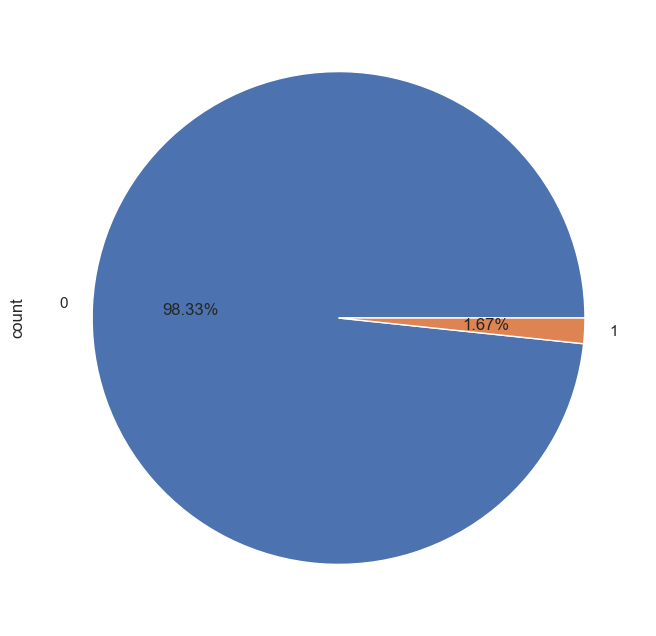

<Figure size 100x100 with 0 Axes>

After Oversampling Training Data has 118000 rows


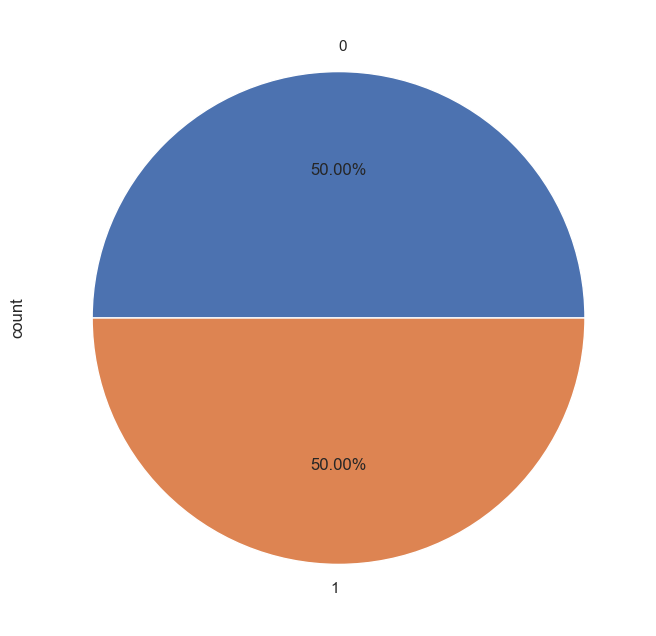

Before Oversampling Training Data has 16000 rows


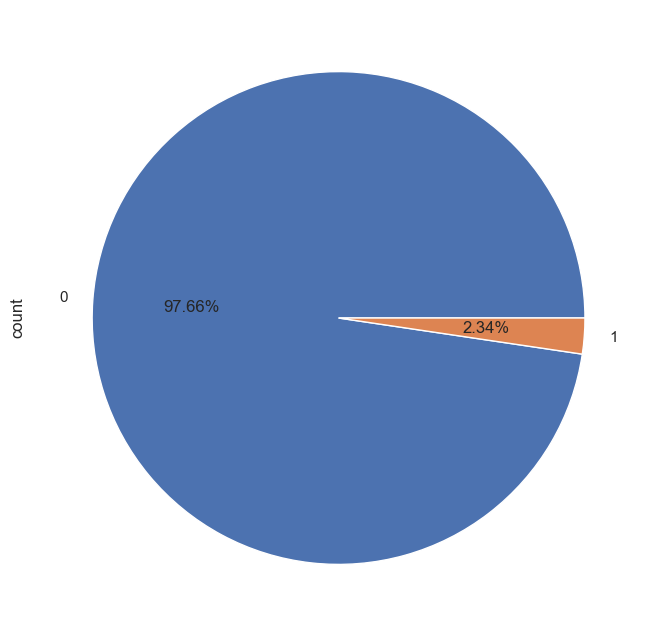

<Figure size 100x100 with 0 Axes>

After Oversampling Training Data has 31250 rows


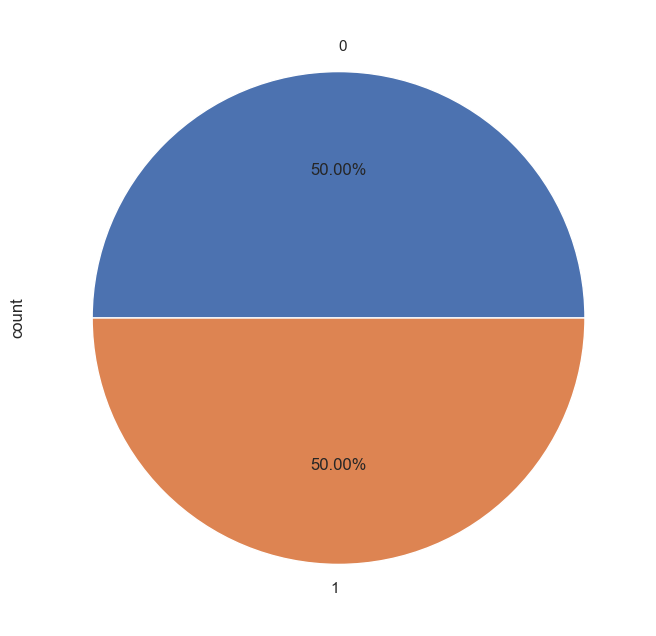

In [28]:
X_train_smote, y_train_smote = smote_prep(X_train,y_train_xgb)
X_test_smote, y_test_smote = smote_prep(X_test,y_test_xgb)

In [29]:
XGB_5_smote = XGBoostCV(5)
XGB_5_smote 

,0,1
0,0.983087,0.01
6,0.982430,1.20
4,0.981610,0.50
11,0.981543,3.00
1,0.980797,0.05
3,0.980490,0.20
2,0.980308,0.10
7,0.979229,1.40
9,0.978929,1.80
12,0.976505,4.00


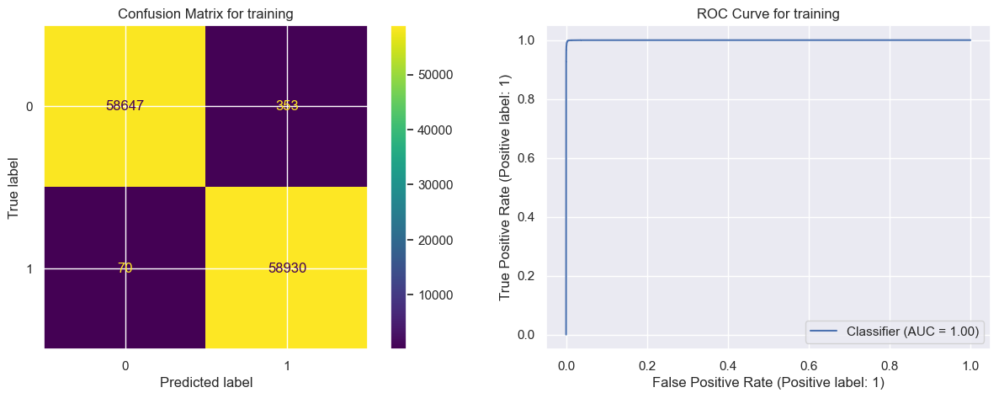

ROC AUC Score for training is:  0.9999044148233267
Accuracy Score for training is:  0.9964152542372882
Test Error for training is:  0.0036


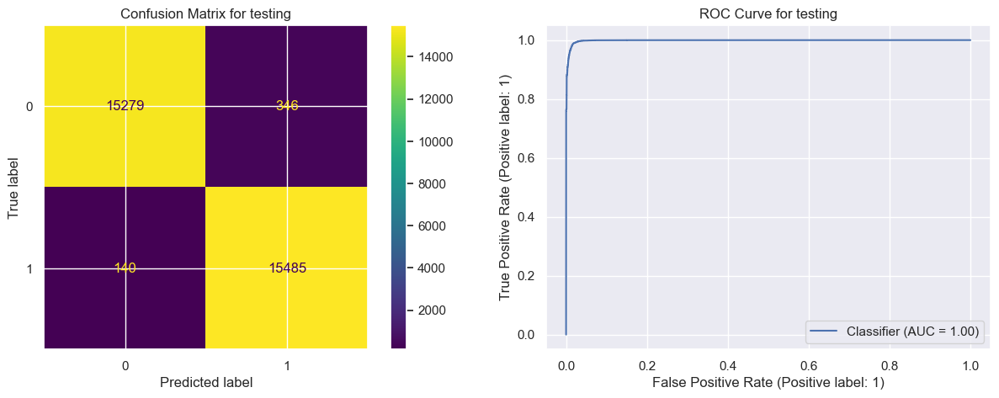

ROC AUC Score for testing is:  0.9985969561600001
Accuracy Score for testing is:  0.984448
Test Error for testing is:  0.0156


In [30]:
# model_xgb = XGBClassifier(random_state=60000, reg_alpha=0.01).fit(X_train, y_train_xgb)
params = {"objective":"binary:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                        'max_depth': 5, 'alpha': 0.01}
model_xgb = XGBClassifier(**params).fit(X_train_smote, y_train_smote)
# y_pred_train = xgb.predict(X_train)
# y_pred = xgb.predict(X_test)
# y_pred_prob = xgb.predict_proba(X_test)
get_metrics(model_xgb,X_train_smote,y_train_smote,"training",True)
# mae = mean_absolute_error(y_train_smote, y_pred_prob[:, 1])
get_metrics(model_xgb,X_test_smote,y_test_smote,"testing",True)
# mae = mean_absolute_error(y_test_smote, y_pred_prob[:, 1])
# print('Mean Absolute Error: %.3f' % mae)

## 2. ISLR 6.6.3

Suppose we estimate the regression coefficients in a linear regression model by minimizing
for a particular value of s. For parts (a) through (e), indicate which
of i. through v. is correct. Justify your answer.<br>
i. Increase initially, and then eventually start decreasing in an inverted U shape.<br>
ii. Decrease initially, and then eventually start increasing in a U shape.<br>
iii. Steadily increase. <br>
iv. Steadily decrease. <br>
v. Remain constant.<br>

<b>(a) As we increase s from 0, the training RSS will:<br>
iv. Steadily decrease. </b>As we increase s value from 0, we are going from underfitting to overfiting. Hence training RSS would steadily decrease.

<b>(b) Repeat (a) for test RSS. <br>
ii. Decrease initially, and then eventually start increasing in a U shape. </b>Since our models going from underfit to overfit, testing RSS will first go down to a point that has lowest test RSS and then increase due to overfitting.

<b>(c) Repeat (a) for variance.<br>
iii. Steadily increase. </b> s is 0 in the beginning which would mean that there is almost no variance. As we increasing s, betas are increasing and the variance steadily increase.

<b>(d) Repeat (a) for (squared) bias.<br>
iv. Steadily decrease.</b> Due to the bias-variance trade-off, the increasing of variance will cause the bias to decrease.

<b>(e) Repeat (a) for the irreducible error.<br>
v. Remain constant.</b> Irreducible error is the nature of a model, and there's no way to change it. Hence, it remain constant.

## 3. ISLR 6.6.5

It is well-known that ridge regression tends to give similar coefficient values to correlated variables, whereas the lasso may give quite different coefficient values to correlated variables. We will now explore this property in a very simple setting.
Suppose that n = 2, p = 2, x11 = x12, x21 = x22. Furthermore, suppose that y1+y2 =0 and x11+x21 =0 and x12+x22 =0,so that the estimate for the intercept in a least squares, ridge regression, or lasso model is zero: βˆ0 = 0.<br>

(a) Write out the ridge regression optimization problem in this setting.

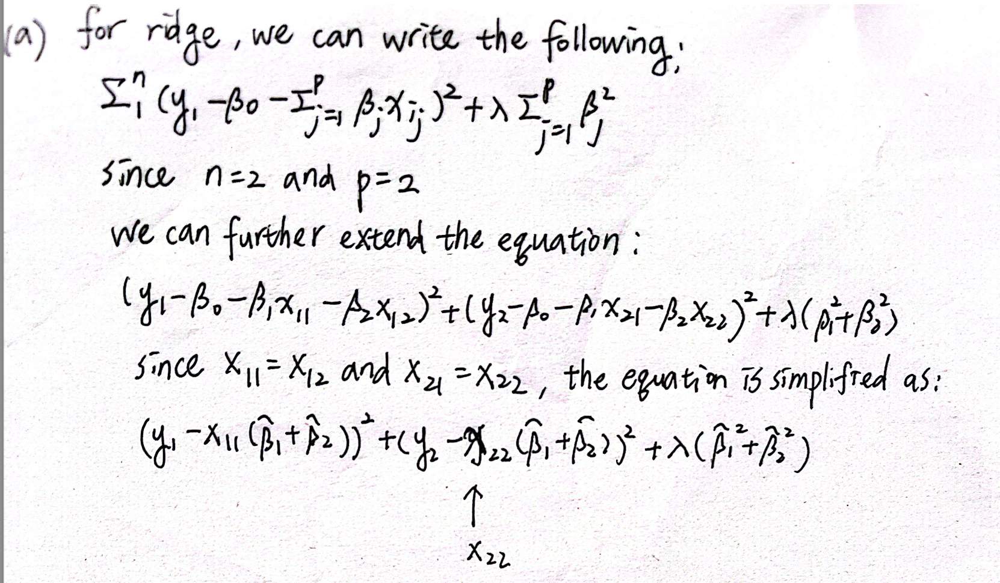

(b) Argue that in this setting, the ridge coefficient estimates satisfy βˆ 1 = βˆ 2 .<br>

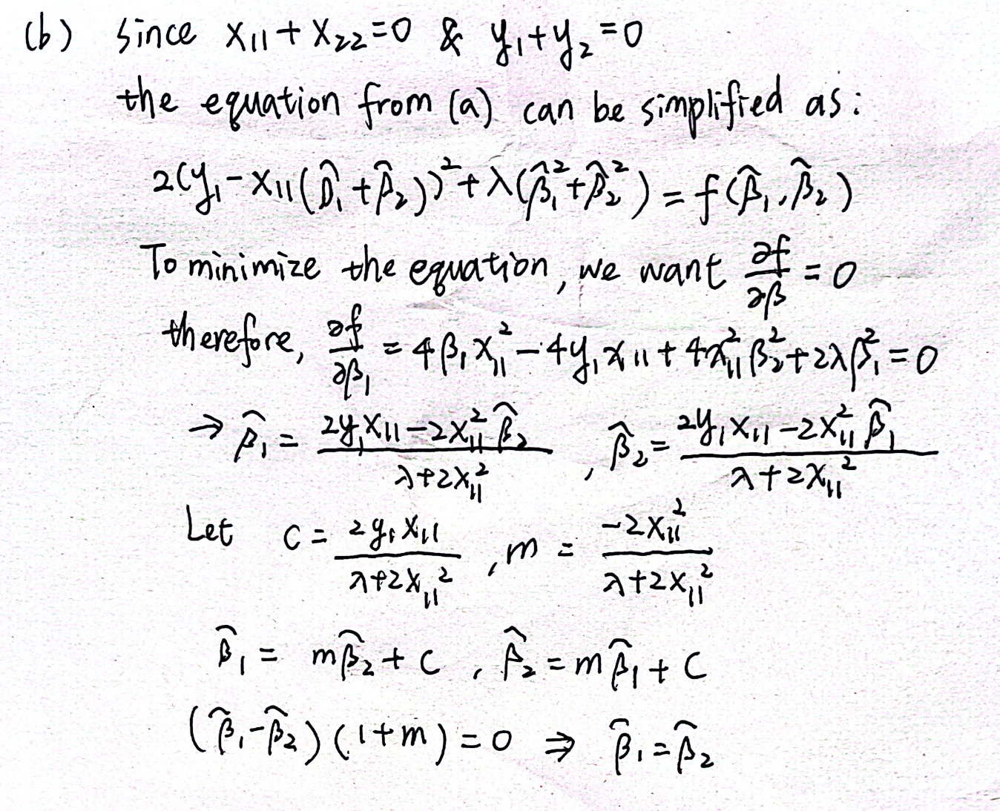

(c) Write out the lasso optimization problem in this setting.<br>

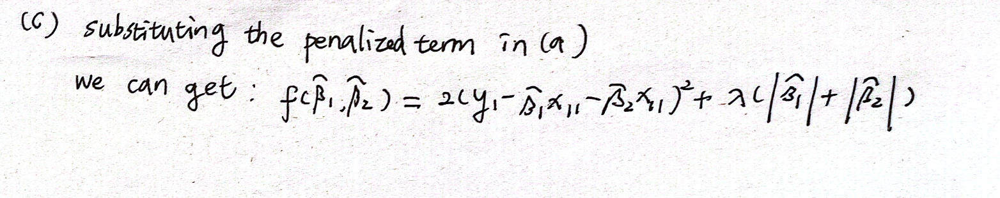

(d) Argue that in this setting, the lasso coefficients βˆ1 and βˆ2 are not unique in other words, there are many possible solutions to the optimization problem in (c). Describe these solutions.<br>

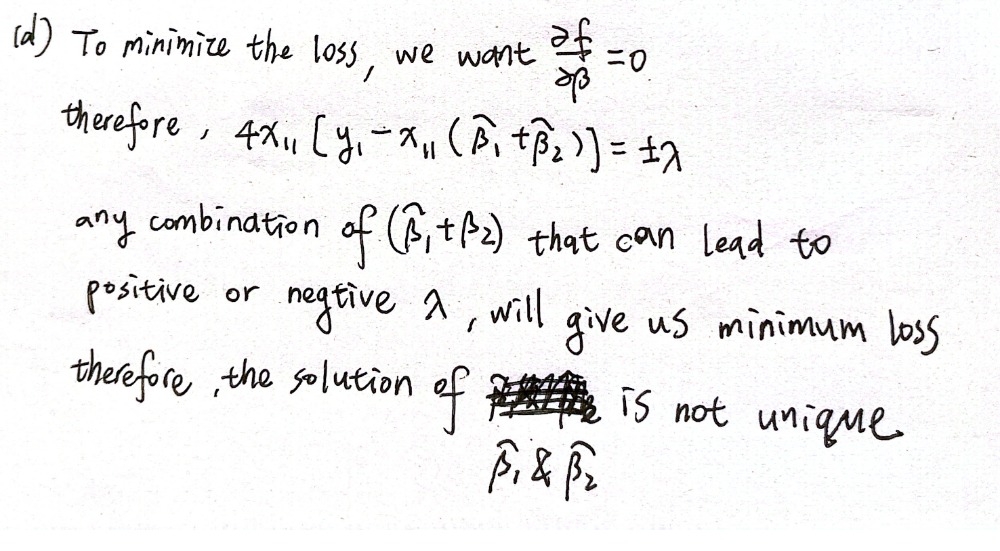

## 4. ISLR 8.4.5

Suppose we produce ten bootstrapped samples from a data set containing red and green classes. We then apply a classification tree to each bootstrapped sample and, for a specific value of X, produce 10 estimates of P(Class is Red|X):
0.1, 0.15, 0.2, 0.2, 0.55, 0.6, 0.6, 0.65, 0.7, and 0.75.
There are two common ways to combine these results together into a single class prediction. One is the majority vote approach discussed in this chapter. The second approach is to classify based on the average probability. In this example, what is the final classification under each of these two approaches?

Majority Polling: <br>
For binary classification, when overall probability is greater than 0.5, the classification will be true and else otherwise. In this case, 6 samples have probability >= 0.5, and 4 samples have probability < 0.5. Since positive class is in majority, it's labeled as red.<br>

Average Probability: <br>Mean for given probabilities = 0.45 hence the classification false and predict to be green.<br>

## 5. ISLR 9.7.3

Here we explore the maximal margin classifier on a toy data set.<br>

In [4]:
from sklearn import svm
toy_df = pd.DataFrame({'X1': [3, 2, 4, 1, 2, 4, 4], 'X2':[4, 2, 4, 4, 1, 3, 1], 'Y':['red', 'red', 'red', 'red', 'blue', 'blue', 'blue']})
toy_df['Y'].replace({'red': 0, 'blue': 1}, inplace = True)
train_x = toy_df.drop(['Y'], axis = 1)
train_y = toy_df['Y']
model = svm.SVC(kernel = 'linear', C = 1000)
model.fit(train_x, train_y)
y_pred = model.predict(train_x)

/Users/olivia/anaconda3/lib/python3.11/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/var/folders/1n/3z30r1295bx1jmlds_fmgb080000gn/T/ipykernel_87179/1610819493.py:12: UserWarning: The following kwargs were not used by contour: 'label'
  ax2.contour(x_axis, y_axis, z_axis, colors = 'k', levels = [-1, 0, 1], alpha = 0.5,linestyles=['dashed', 'solid', 'dashed'], label = "Decision Boundary")


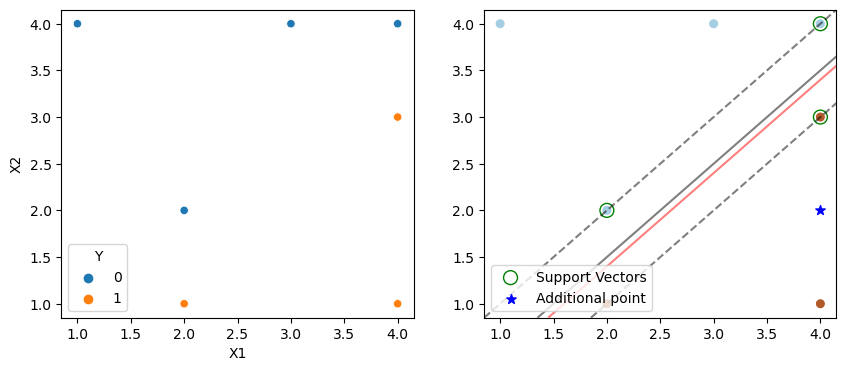

[-1.0004096] [[ 1.9998464 -1.9996928]]


In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
#(a)
sns.scatterplot(data = toy_df, x = "X1", y = "X2", hue = "Y", ax = ax1)

ax2.scatter(toy_df.iloc[:, 0], toy_df.iloc[:, 1], c = toy_df.iloc[:, -1], s = 30, cmap = plt.cm.Paired)

xlim, ylim = ax2.get_xlim(), ax2.get_ylim()
y_axis, x_axis = np.meshgrid(np.linspace(xlim[0], xlim[1], 30), np.linspace(xlim[0], xlim[1], 30))
xy_axis = np.vstack([x_axis.ravel(), y_axis.ravel()]).T
z_axis = model.decision_function(xy_axis).reshape(x_axis.shape)
#(b)(d)
ax2.contour(x_axis, y_axis, z_axis, colors = 'k', levels = [-1, 0, 1], alpha = 0.5,linestyles=['dashed', 'solid', 'dashed'], label = "Decision Boundary")
#(e)
ax2.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1], s = 100, facecolors = 'none', edgecolors='g', label = "Support Vectors")
#(g)
ax2.contour(x_axis, y_axis, z_axis - 0.2, colors = 'r', levels = [0], alpha = 0.5, linestyles=['solid'])
#(h) 
ax2.scatter([4.0], [2.0], color = 'b', marker = '*', s = 50, label = "Additional point")

ax2.legend(loc='lower left')
plt.show()

<b>(a) We are given n = 7 observations in p = 2 dimensions. For each observation, there is an associated class label.
Sketch the observations.</b><br>shown above.

<b>(b) Sketch the optimal separating hyperplane, and provide the equation for this hyperplane (of the form (9.1)).</b><br>The solid black line is the hyperplane

<b>(c) Describe the classification rule for the maximal margin classifier. It should be something along the lines of “Classify to Red if β0 + β1X1 + β2X2 > 0, and classify to Blue otherwise.” Provide the values for β0, β1, and β2.</b><br>β0 + β1X1 + β2X2 > 0 implies red, otherwise blue <br> β0=1, β1=-1, and β2=2.

<b>(d) On your sketch, indicate the margin for the maximal margin hyperplane.</b><br>The dashed line shown above

<b>(e) Indicate the support vectors for the maximal margin classifier.</b><br> The circled ones are the support vectors

<b>(f) Argue that a slight movement of the seventh observation(4,1,"Blue") would not affect the maximal margin hyperplane.</b><br> Since the seventh point is far away from the maximal margin hyperplane, the effect it apply on decision boundary is small. Therefor a slight movement of it would not affect the maximal margin hyperplane.

<b>(g) Sketch a hyperplane that is not the optimal separating hyperplane, and provide the equation for this hyperplane.</b><br>The solid red line

<b>(h) Draw an additional observation on the plot so that the two classes are no longer separable by a hyperplane.</b><br>
The new point marked as a blue star. 